In [1]:
import sys
import os
import matplotlib.pyplot as plt 
import numpy as np 
import rt1plotpy
import scipy.sparse as sparse
from numba import jit 
import rt1plotpy
import cv2


%load_ext autoreload
%autoreload 2   

import debug_init
from debug_init import *    
sys.path.insert(0,os.pardir)
import rt1kernel
import rt1raytrace

you have to "create_induced_point()" or "set_induced_point()" next.


Arcs  detection: 100%|██████████| 9/9 [00:01<00:00,  5.96it/s]


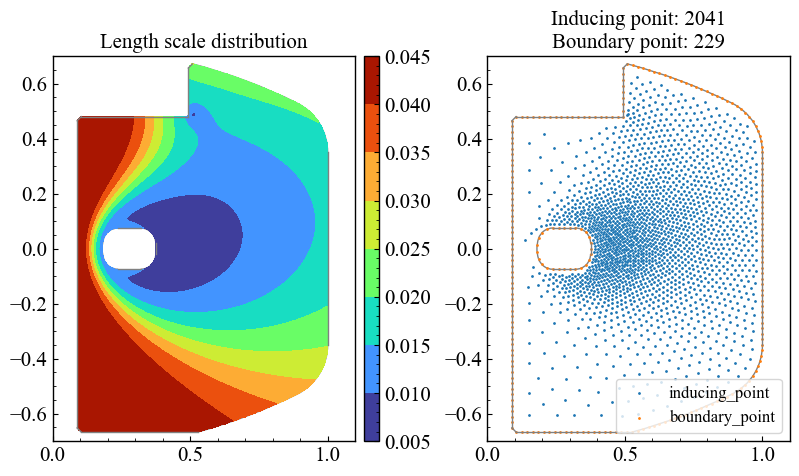

In [2]:
RT1_kernel = rt1kernel.Kernel2D_scatter(dxf_file='../dxf_files/simplest0.dxf',show_print=False)
RT1_kernel.load_point(**np.load('point_20220701.npz'),length_sq_fuction=Length_scale_sq,is_plot=True)
#RT1_kernel.load_point(**np.load('point_20220614.npz'),length_sq_fuction=Length_scale_sq,is_plot=True)

rI,zI = RT1_kernel.rI,RT1_kernel.zI
nI    = RT1_kernel.nI

Arcs  detection: 100%|██████████| 9/9 [00:02<00:00,  3.44it/s]


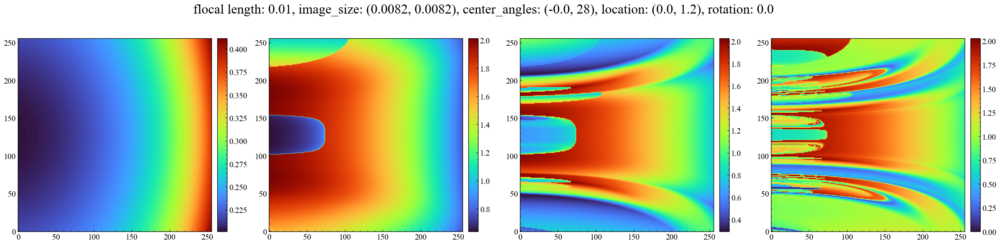

In [5]:
r_medium = np.linspace(0.05,1.05,150)
z_medium = np.linspace(-0.7,0.7,150)
r_plot   =np.linspace(0.05,1.10,551)
z_plot   =np.linspace(-0.7,0.7,501)


RT1_kernel.set_grid_interface( z_medium=z_medium,
                               r_medium=r_medium,
                               z_plot  =z_plot  ,
                               r_plot  =r_plot  ,add_bound=True) 
R_plot,Z_plot = np.meshgrid(r_plot,z_plot,indexing='ij')
mask,plot_kwargs = RT1_kernel.grid_input(R_plot,Z_plot)

RT1_ray =  rt1raytrace.Raytrace_load_model('model\\Raytrace_test-20220616.pkl',is_plot=True)

Obs = rt1kernel.Observation_Matrix_integral_load_model(path='model\\Observation_Matrix_integral_20220714-light.pkl')
#Obs = rt1kernel.Observation_Matrix_integral_load_model(path='model2\\Observation_Matrix_integral_20220619.pkl')
Obs.set_directon()

num of bound point is  461
Eigenvalue decomposition is recalculated


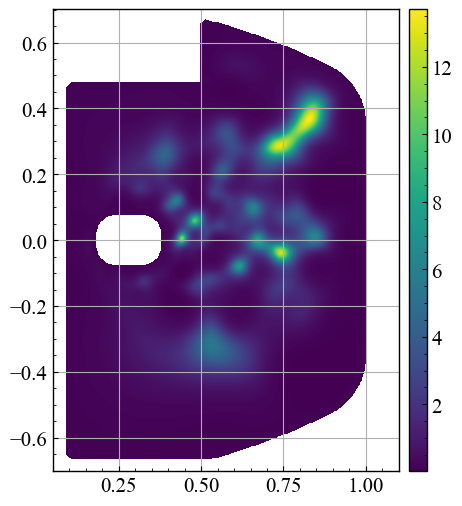

In [46]:
boundary = -2
#K= RT1_kernel.set_kernel(length_scale=1,bound_value=boundary)

K,f_pri = RT1_kernel.set_kernel(length_scale=2,bound_value=boundary,bound_sig=0.1,bound_space=10e-3)

f =  RT1_kernel.sampler(K,f_pri)
f,mask,im_kwargs = RT1_kernel.convert_grid(f,boundary=boundary)

fig,ax=plt.subplots(figsize=(6,6))
imshow_cbar(ax,np.exp(f)*mask,**im_kwargs)

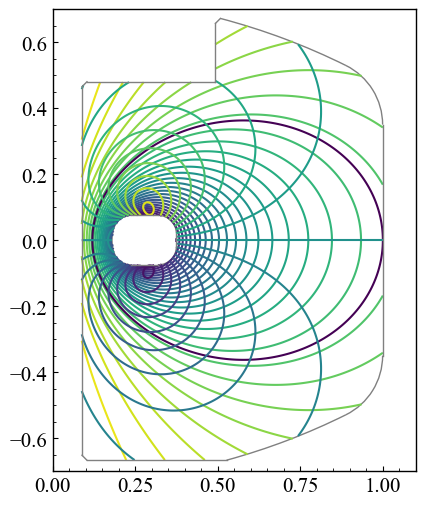

In [7]:
Psi = rt1plotpy.mag.psi(R_plot,Z_plot,separatrix=False)
br,bz = rt1plotpy.mag.bvec(R_plot,Z_plot,separatrix=False)
Babs = np.sqrt(br**2+bz**2)
#psi_b =psi.flatten()[np.argmin(Babs)]

bound_index = np.argmin((R_plot-1.0)**2+(Z_plot-0.0)**2)
psi_b = Psi.flatten()[bound_index]
fig,ax = plt.subplots(figsize=(8,6))
ax.set(**rt1_ax_kwargs)
ax.contour(R_plot,Z_plot,Psi*mask.T,levels=30)
ax.contour(R_plot,Z_plot,Psi*mask.T,levels=[psi_b])
ax.contour(R_plot,Z_plot,br*np.log(Babs)*mask.T,levels=20)
RT1_kernel.append_frame(ax)


num of bound point is  48
Eigenvalue decomposition is recalculated


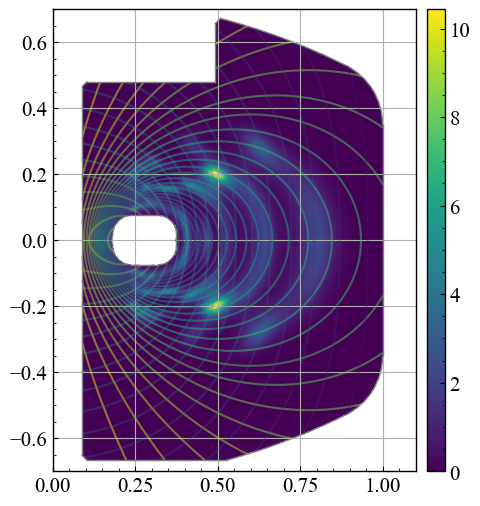

In [67]:
psi_i = rt1plotpy.mag.psi(rI,zI,separatrix=False)

is_outer = (psi_i > psi_b*0.9) + (rI < 0.2) 
bound_value = -5
Kflux_pri,muf_pri = RT1_kernel.set_flux_kernel(psi_scale=0.25,B_scale=0.25,bound_value=bound_value,bound_sig=1,zero_value_index=is_outer)
f =  RT1_kernel.sampler()
f,mask,im_kwargs = RT1_kernel.convert_grid(f,boundary=boundary)

fig,ax=plt.subplots(figsize=(6,6))
ax.set(**rt1_ax_kwargs)
imshow_cbar(ax,np.exp(f)*mask,**im_kwargs,vmin=0)
ax.contour(R_plot,Z_plot,Psi*mask.T,levels=30,alpha=0.5)
ax.contour(R_plot,Z_plot,np.log(Babs)*mask.T,levels=20,alpha=0.3)
RT1_kernel.append_frame(ax)

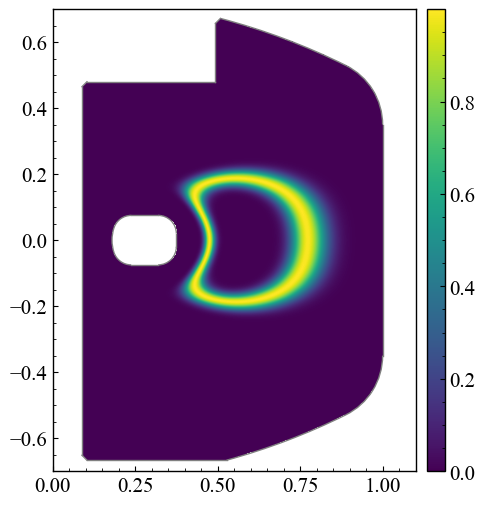

In [9]:
fring_key = { 'n0':1,'a':0.005,'b':0.3,'rmax':0.58,'separatrix':False}
f_ring_HD =func_ring(r=R_plot.T,z=Z_plot.T,**fring_key)
f_ring = func_ring(r=rI,z=zI,**fring_key)

fig,ax = plt.subplots(figsize=(6,6))
ax.set(**rt1_ax_kwargs)
RT1_kernel.append_frame(ax)
imshow_cbar(ax,f_ring_HD**mask,**im_kwargs)

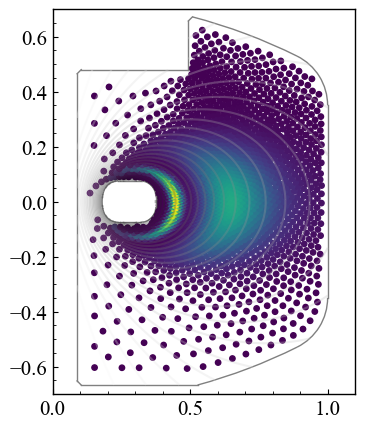

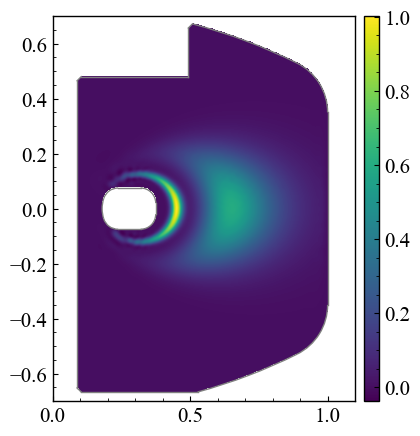

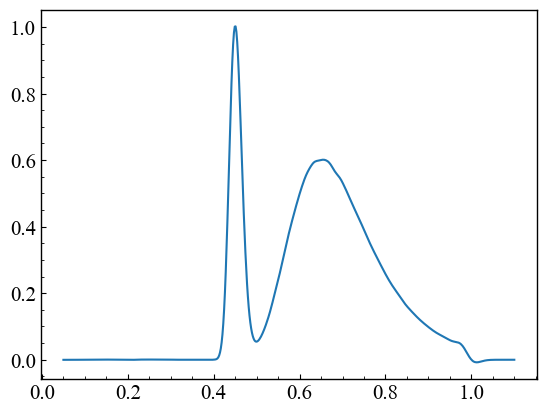

In [10]:
f = gaussian(r=rI,z=zI,n0=1,a=45,b=1,rmax=0.45,separatrix=False)+0.6*gaussian(r=rI,z=zI,n0=1,a=8,b=1.5,rmax=0.65,separatrix=False)
f[(zI > 0.45) & (rI < 0.55)] = 0

fig,ax = plt.subplots(figsize=(5,5))
    

ax.set(**rt1_ax_kwargs)
RT1_kernel.append_frame(ax)
plt.scatter(x=rI,y=zI,c=f,s=15)

plt.contour(R_plot,Z_plot,Psi*mask.T,levels=30,alpha=0.3,cmap='gray')
plt.show()
#plt.imshow(H.projection(f),origin='lower')

f_typical  = f.copy()
del f 

fig,ax = plt.subplots(figsize=(5,5))
f_typical_HD,mask,im_kwargs = RT1_kernel.convert_grid(f_typical,boundary=0)
ax.set(**rt1_ax_kwargs)
RT1_kernel.append_frame(ax)
imshow_cbar(ax,f_typical_HD*mask,**im_kwargs)
plt.show()
plt.plot(r_plot,f_typical_HD[250,:])

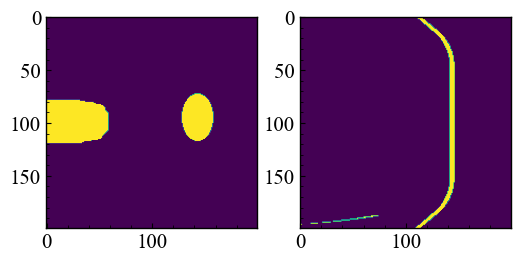

In [11]:
mask_im = cv2.imread('mask_test_for_ref.png') 

mask_k = (mask_im[:,:,0] == 0) & (mask_im[:,:,1] ==0)  & (mask_im[:,:,2] == 0)

#mask_k = np.zeros(Obs.shape[:2],dtype=np.bool8)

mask_k2 = abs((Obs.Hs[1].ray.Phi0-np.pi) +0.5) < 0.02
fig,axs=plt.subplots(1,2,figsize=(6,3))
axs[0].imshow(mask_k )
axs[1].imshow(mask_k2 )


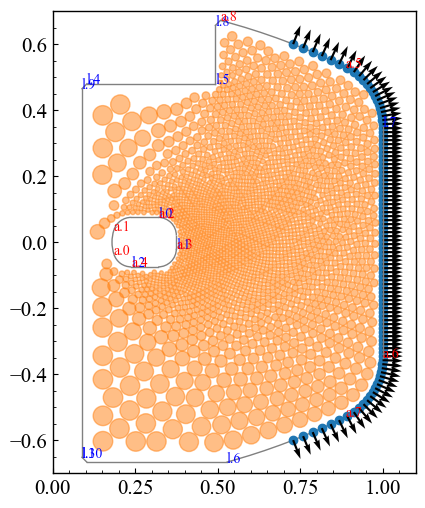

In [12]:
zIb = np.linspace(-0.6,0.6,100)
H_diff = rt1kernel.reflection.H_diffusion_func(Obs,zIb,RT1_kernel,Length_scale_sq(rI,zI))

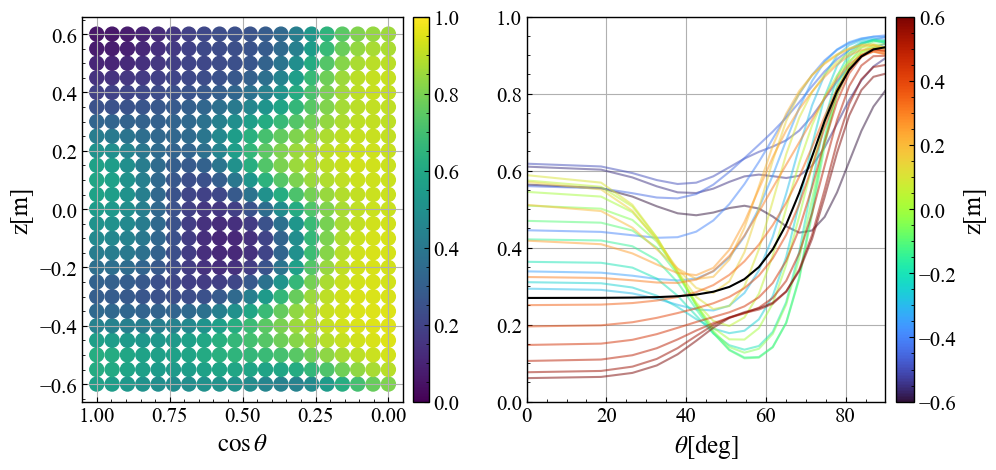

In [211]:
from rt1kernel.reflection import sigmoid,sigmoid_inv

c_len = 0.25
h_len = 0.15

cI = np.linspace(0,1,20)
hI = np.linspace(-0.6,0.6,25)
CI,HI = np.meshgrid(cI,hI,indexing='ij')

RefKernel = rt1kernel.Reflection_Kernel_grid(cI,hI,c_len,h_len,mur_mean=-1)

CI_b,HI_b = np.meshgrid([1.0],hI,indexing='ij')
rg = np.einsum('i,j->ij',[0],np.ones_like(hI))

mur_pri,Kr_pri = RefKernel.add_grad(C_inp=CI_b,H_inp=HI_b, Refgrad_inp=rg)

index_para = (CI == 0.0)
C_90deg,H_90deg = CI[index_para], HI[index_para]
Rv = 4* np.ones_like(C_90deg)

mur_pri,Kr_pri = RefKernel.add_value(C_inp=C_90deg,H_inp=H_90deg,Ref_inp=Rv,sigma =1 )

index_para = (CI == 1.0)
C_90deg,H_90deg = CI[index_para], HI[index_para]
Rv = -0* np.ones_like(C_90deg)

mur_pri,Kr_pri = RefKernel.add_value(C_inp=C_90deg,H_inp=H_90deg,Ref_inp=Rv,sigma =10 )

ref_I = RefKernel.make_sample()

ref_true = ref_I.copy()
#ref_true = -3*np.ones_like(ref_I)

In [212]:
RefKernel.set_ObsMarix_interface(Obs)

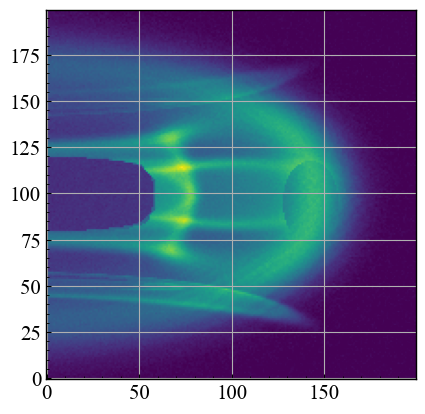

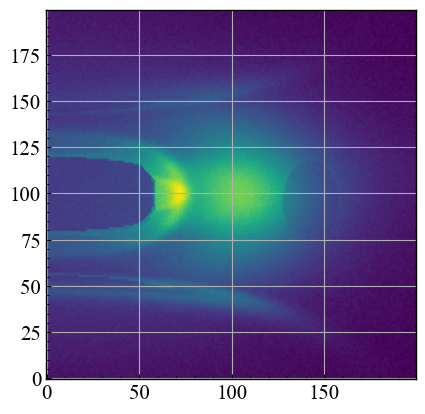

In [231]:
Main = rt1kernel.Reflection_tomography(Ref=RefKernel,Obs=Obs,Kernel=RT1_kernel,H_diff=H_diff) 
g = Main.projection(f_ring,refI=ref_true,n_relection=1,ref_mask=mask_k,diffusion_coef=0.0)
g_obs_ring = g + 0.01*np.random.randn(*g.shape) 
plt.imshow(g_obs_ring,vmin=0,origin='lower')


plt.show()
g = Main.projection(f_typical,refI=ref_true,n_relection=1,ref_mask=mask_k,diffusion_coef=0.0)
g_obs_typi = g + 0.01*np.random.randn(*g.shape) 
plt.imshow(g_obs_typi,vmin=0,origin='lower')

In [233]:
g_obs_list =  [g_obs_ring,g_obs_typi]
f_true_list = [f_ring    ,f_typical]

#_obs_list =  [g_obs_ring]#,g_obs_typi]
#f_true_list = [f_ring    ]#,f_typical]
Main.set_obs(g_obs_list,ref_true,f_true_list,ref_mask=mask_k)

In [240]:
## 初期設定
ref0I_start = -3*np.ones_like(mur_pri)
ref0I_start = mur_pri.copy()-2
f_start     = 0*np.ones(nI)
     
Iteration = 1


ref_now = ref0I_start
f_now   = [f_start]#,f_start]
f_now   = [f_start.copy(),f_start.copy()]

Kr_now = RefKernel.Kr_pri+1e-3*np.eye(HI.size)
f1_RMSE = []
f2_RMSE = []
Phi_log = []
r_RMSE = []
sig_scale_list = []


## Iteration is 31 ##

0 3 6.62178368089341e-10


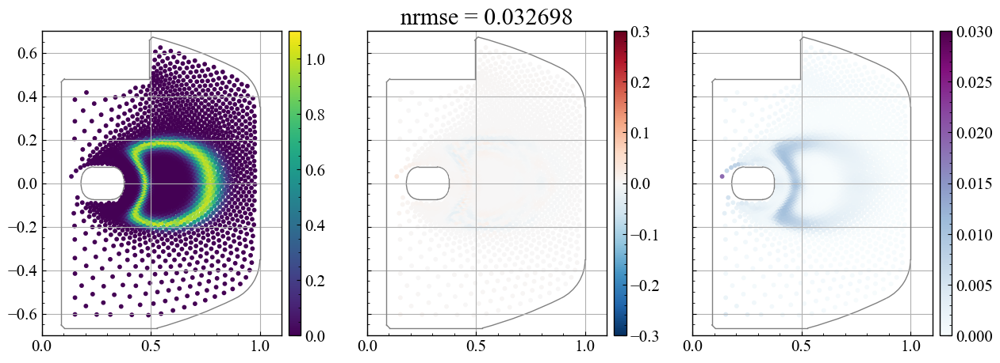

1 3 1.4749613990415e-10


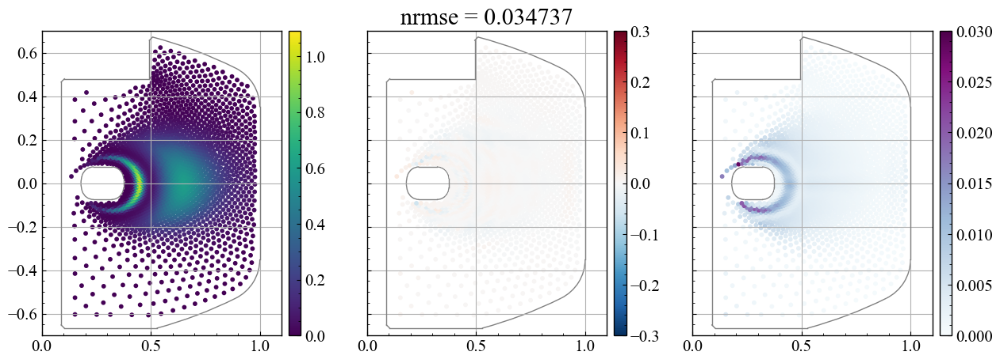


         Current function value: -1280116.750000
         Iterations: 17
         Function evaluations: 87
         Gradient evaluations: 76
calc hessian


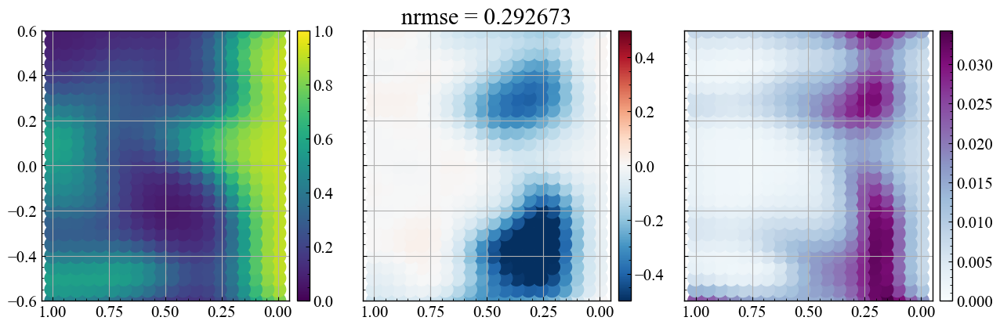

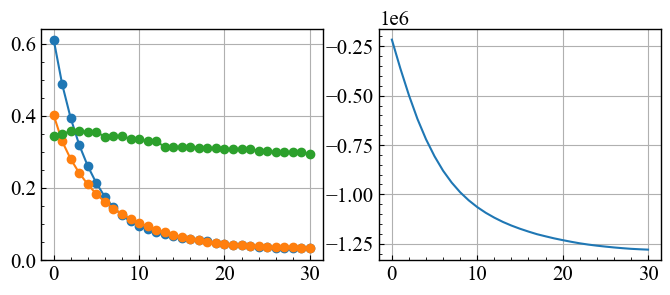

## Iteration is 32 ##

0 3 9.07178868372875e-10


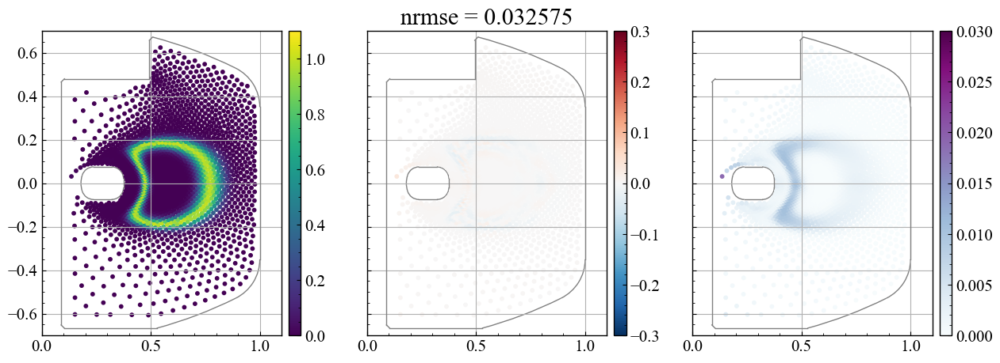

1 3 1.6993248578695016e-09


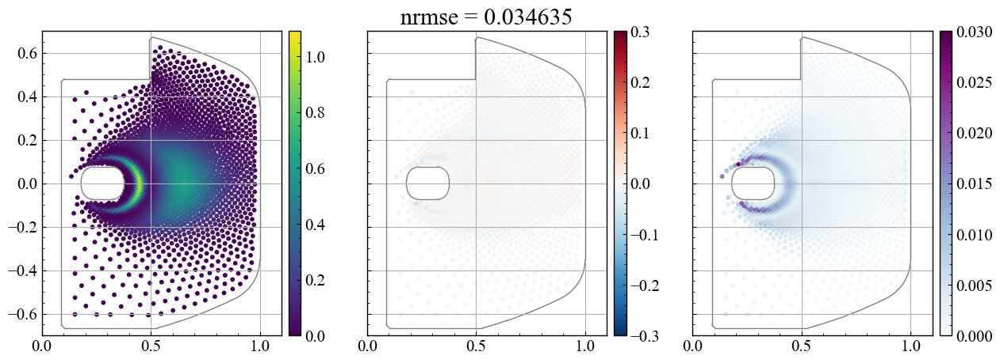


         Current function value: -1281821.375000
         Iterations: 3
         Function evaluations: 139
         Gradient evaluations: 127
calc hessian


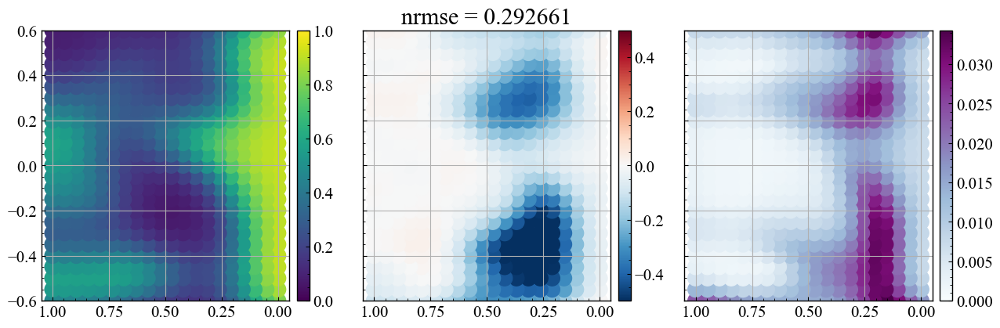

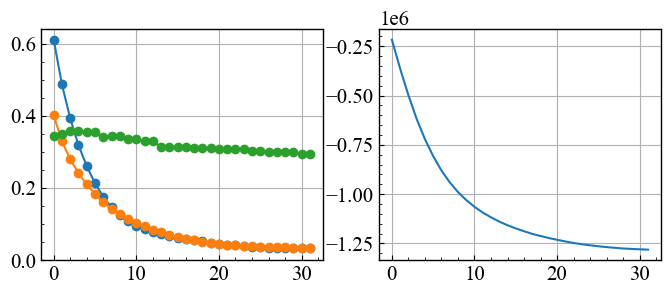

## Iteration is 33 ##

0 3 8.09449453362676e-10


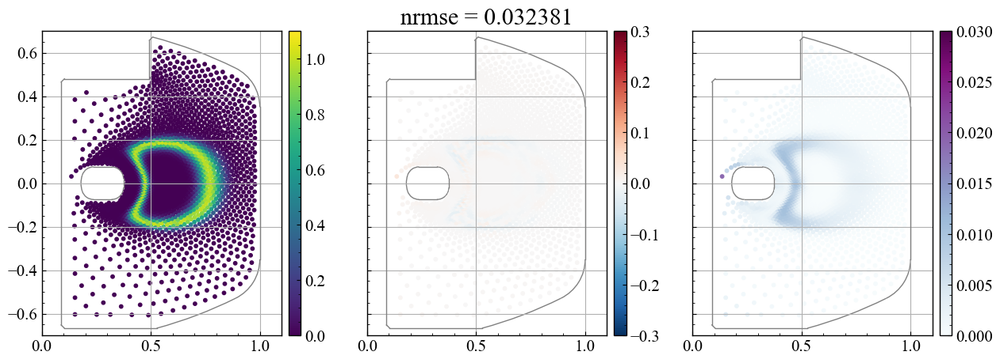

1 3 1.2948784758201978e-10


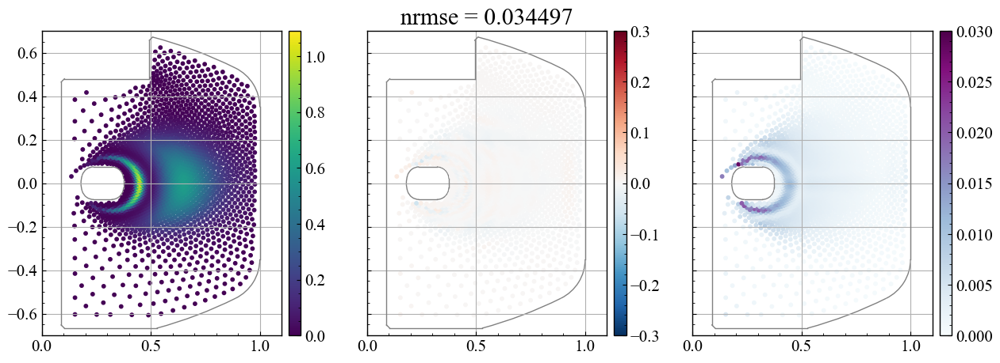


         Current function value: -1283979.500000
         Iterations: 5
         Function evaluations: 59
         Gradient evaluations: 50
calc hessian


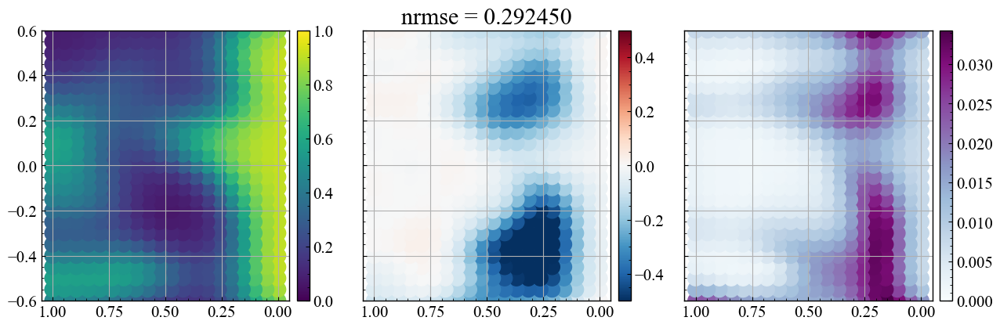

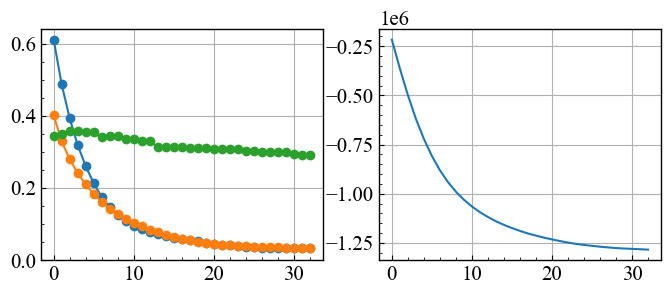

## Iteration is 34 ##

0 3 1.6709524575341571e-09


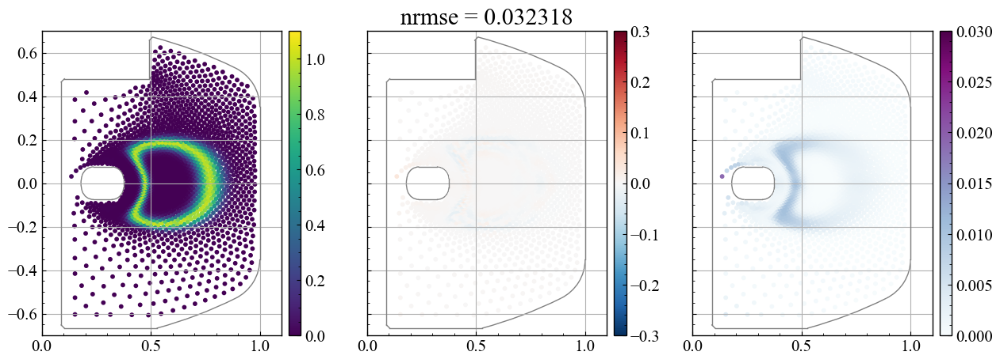

1 3 1.1584797736738349e-10


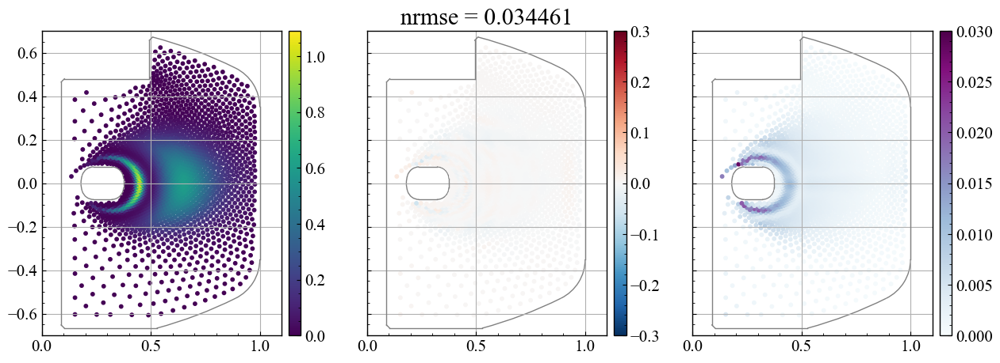


         Current function value: -1285137.750000
         Iterations: 1
         Function evaluations: 68
         Gradient evaluations: 57
calc hessian


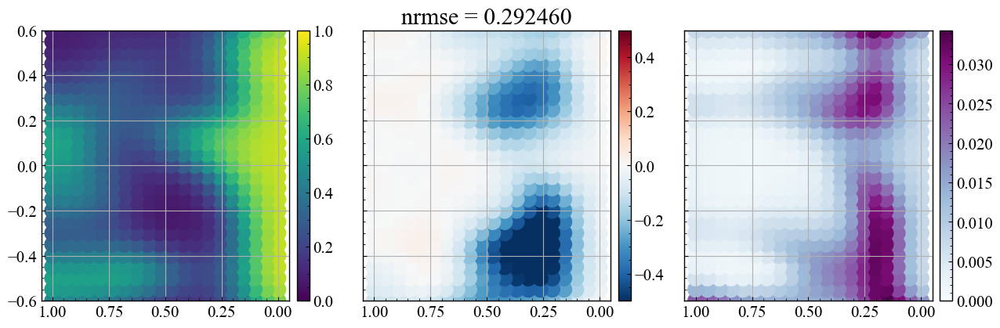

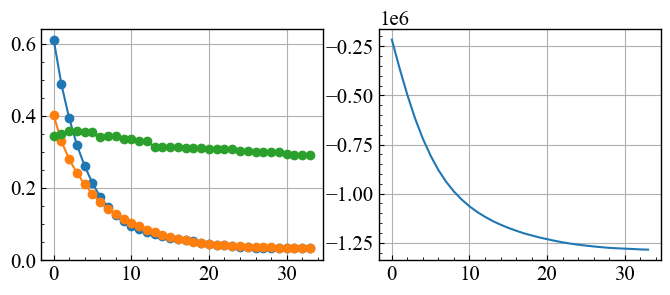

## Iteration is 35 ##

0 3 1.3734524737999832e-09


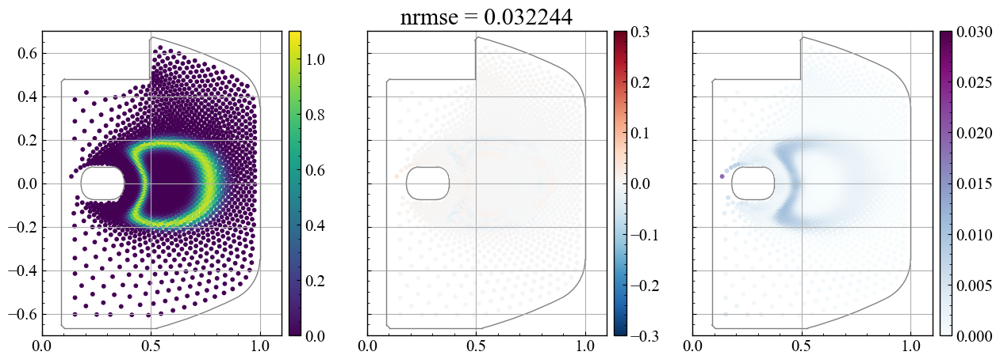

1 3 1.465348064009855e-10


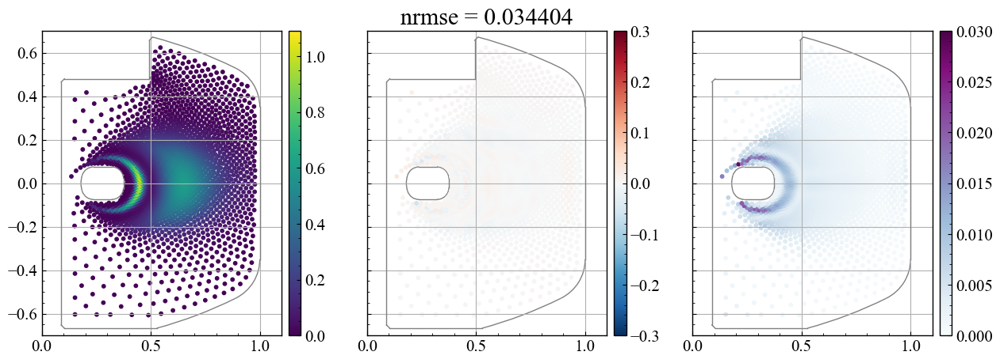


         Current function value: -1285909.500000
         Iterations: 1
         Function evaluations: 68
         Gradient evaluations: 59
calc hessian


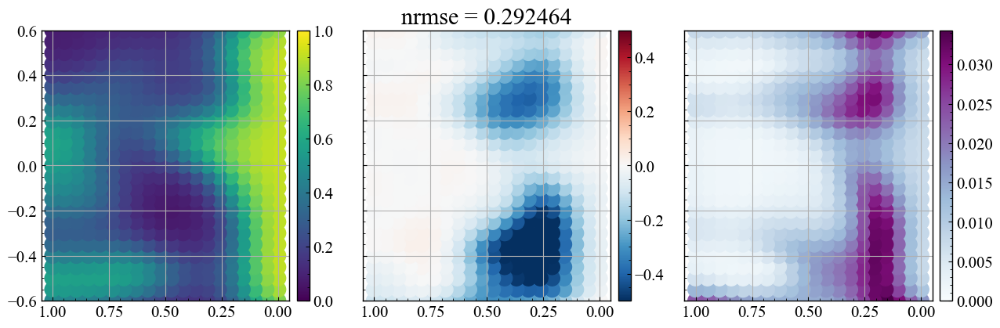

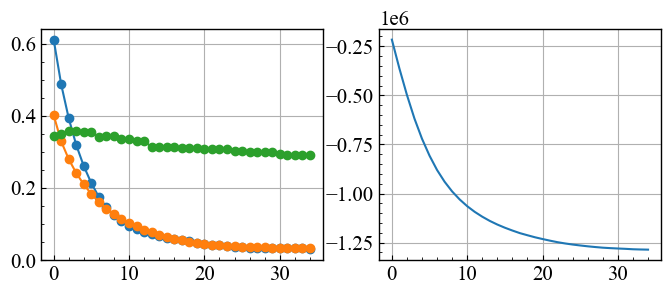

## Iteration is 36 ##

0 3 1.4849073210768961e-09


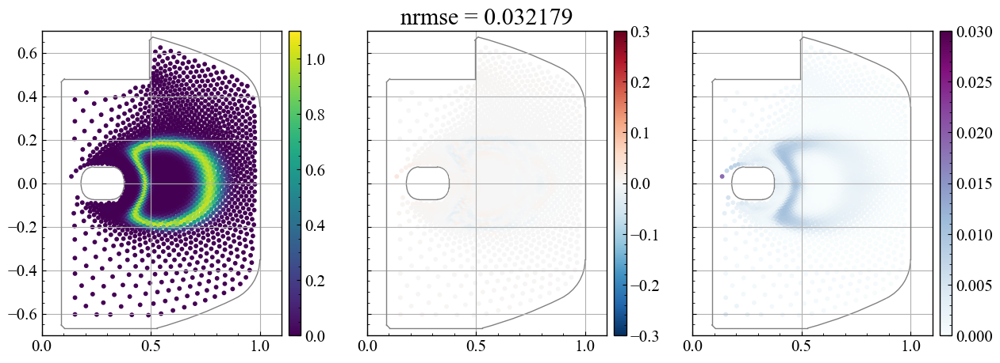

1 3 1.0124070867692239e-10


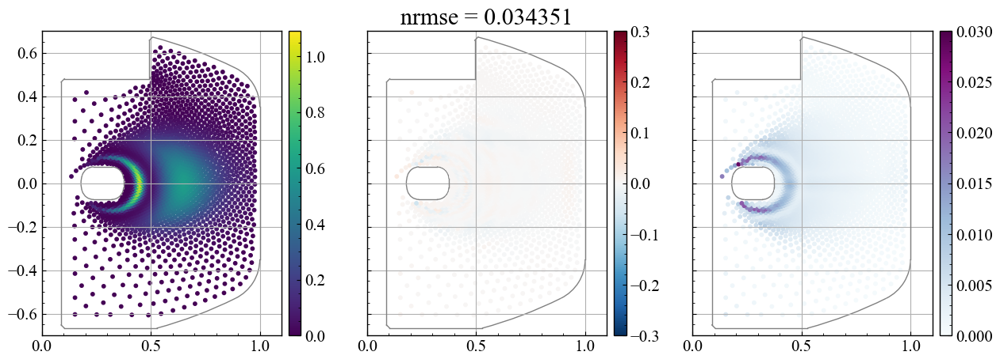


         Current function value: -1286921.000000
         Iterations: 3
         Function evaluations: 146
         Gradient evaluations: 134
calc hessian


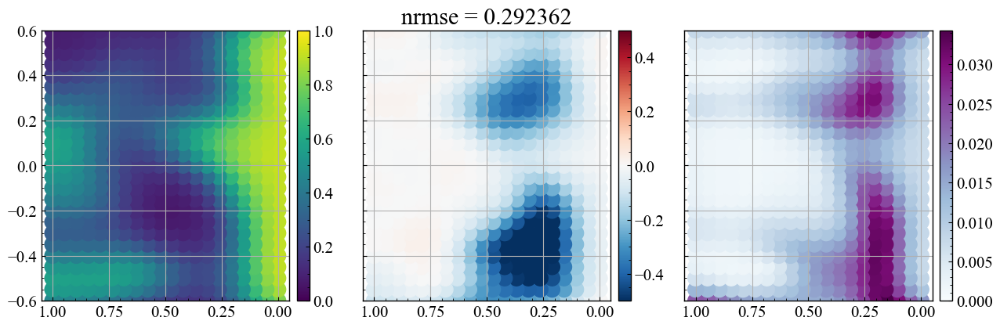

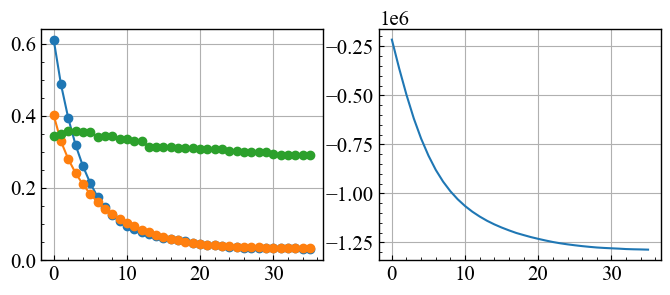

## Iteration is 37 ##

0 3 1.2068238977322955e-09


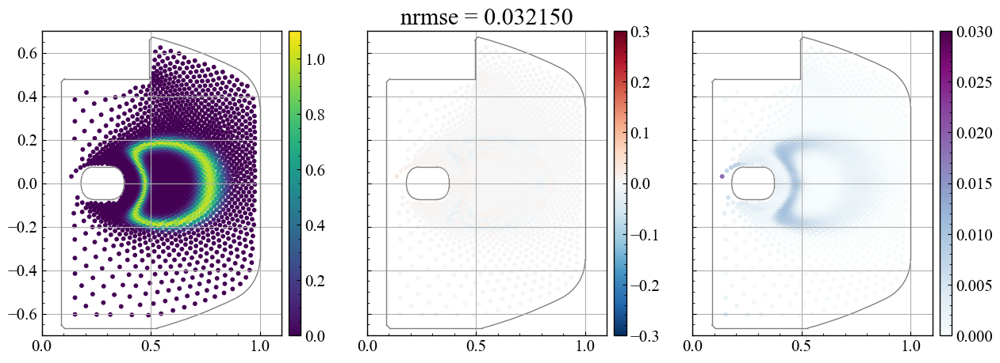

1 3 1.8955810525353275e-10


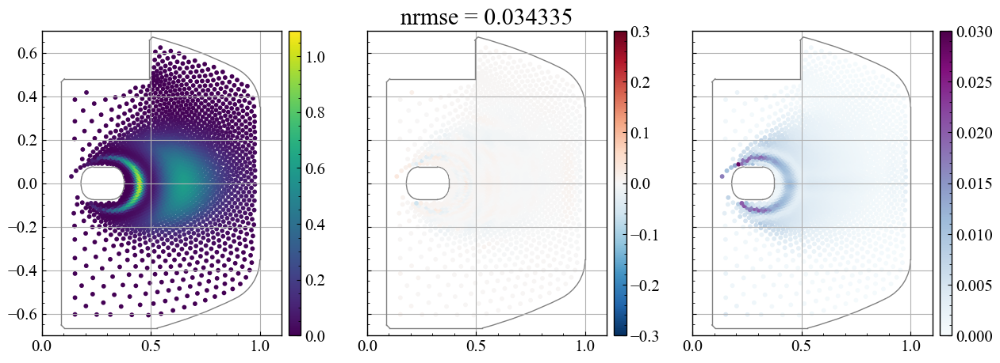


         Current function value: -1287979.625000
         Iterations: 1
         Function evaluations: 87
         Gradient evaluations: 75
calc hessian


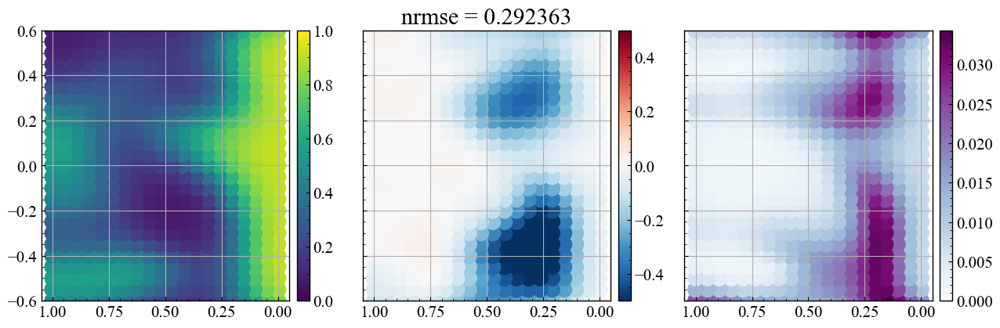

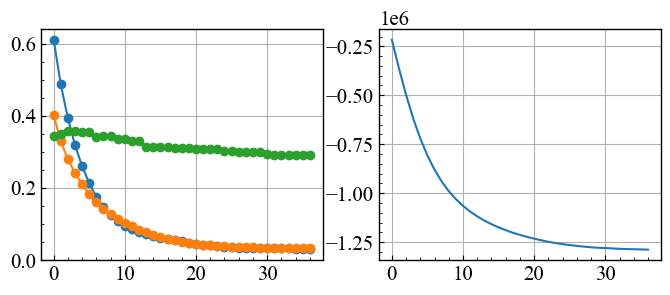

## Iteration is 38 ##

0 3 1.252102668605811e-09


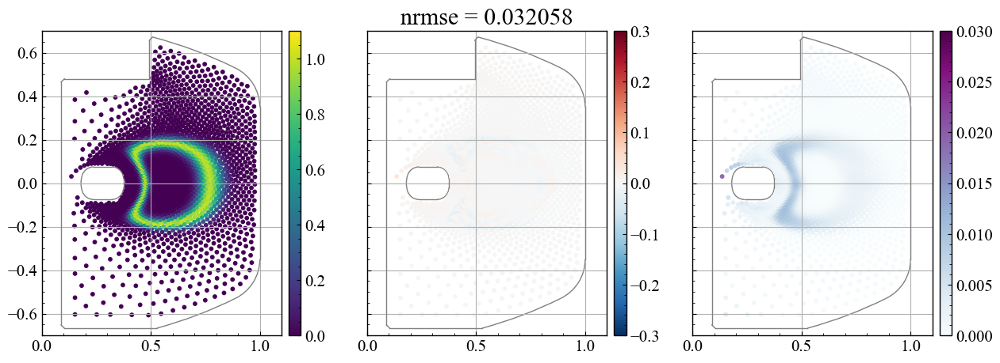

1 2 4.11321147990214e-09


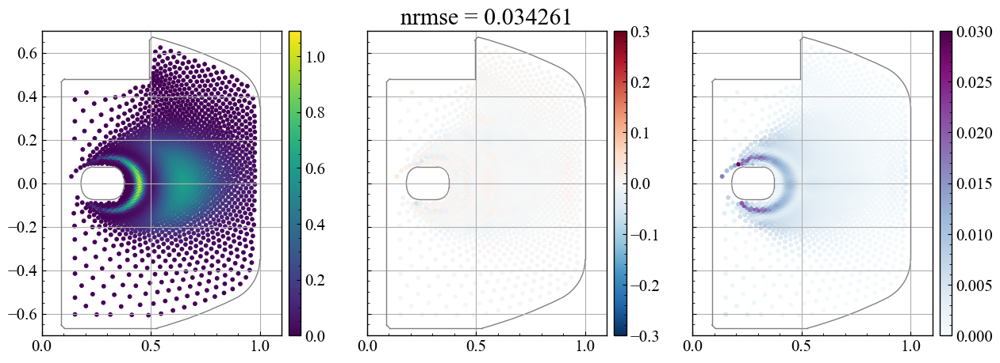


         Current function value: -1288667.875000
         Iterations: 4
         Function evaluations: 153
         Gradient evaluations: 136
calc hessian


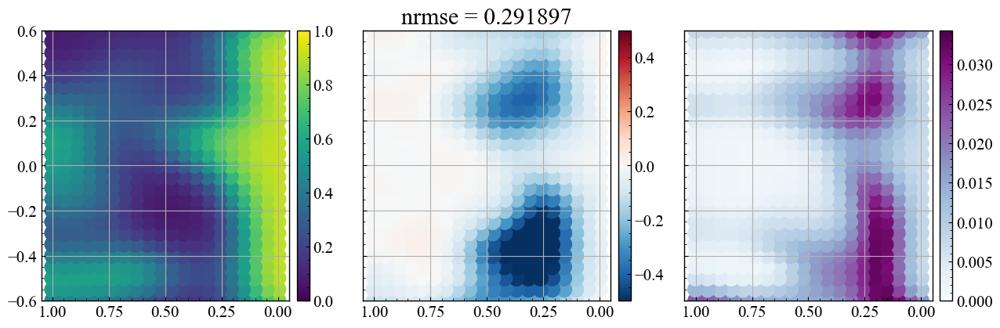

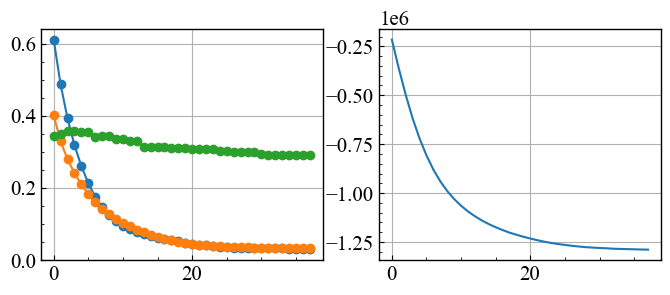

## Iteration is 39 ##

0 3 1.7662022985364791e-09


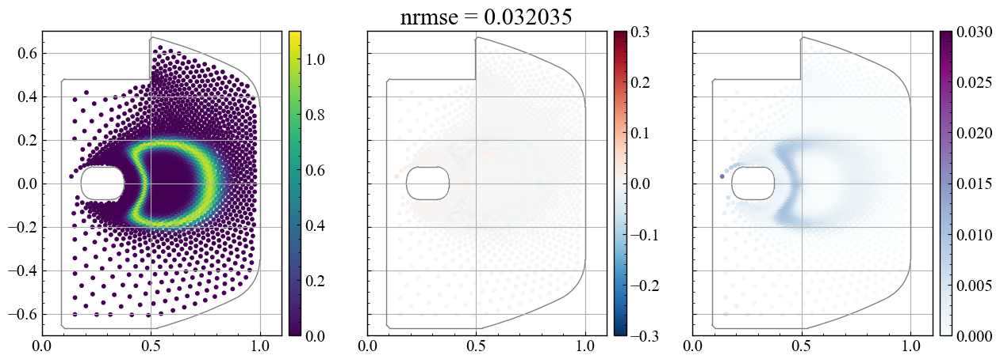

1 2 8.887645568084953e-09


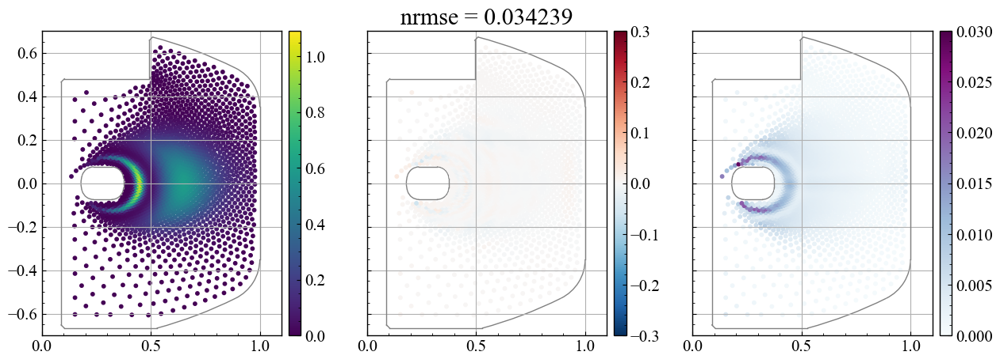


         Current function value: -1289213.250000
         Iterations: 2
         Function evaluations: 57
         Gradient evaluations: 46
calc hessian


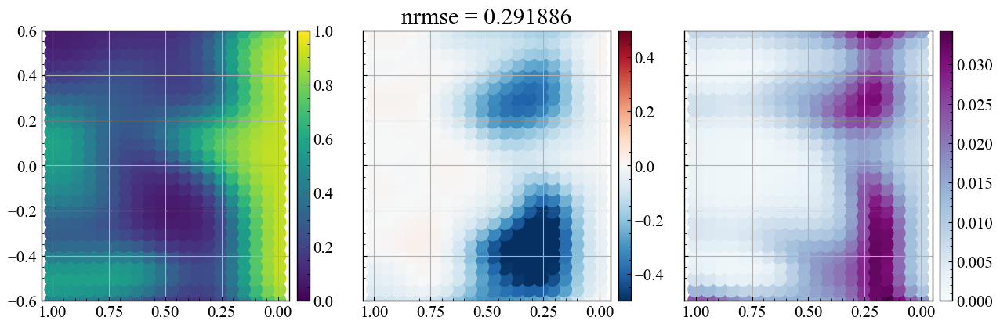

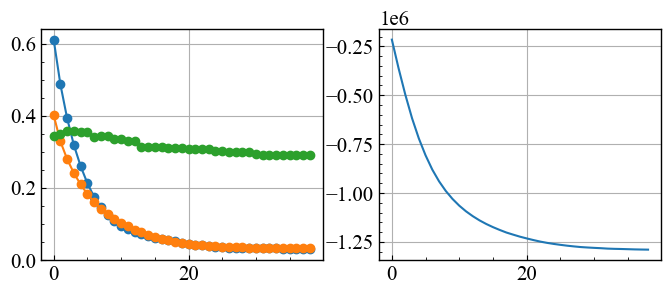

## Iteration is 40 ##

0 2 1.5624445049345635e-09


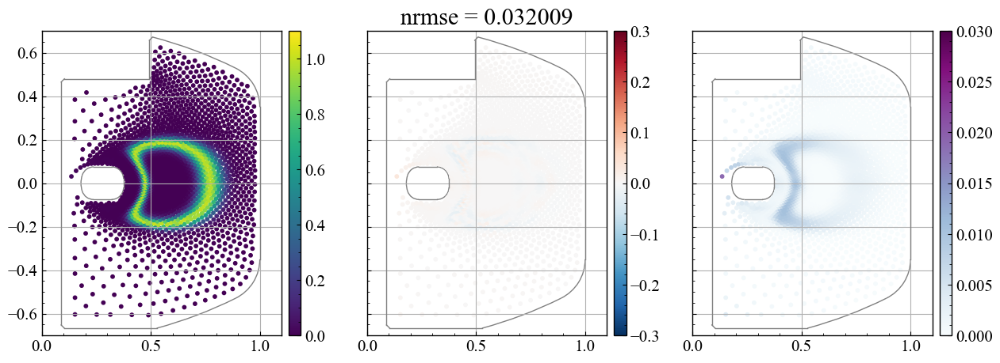

1 2 5.873388830830986e-10


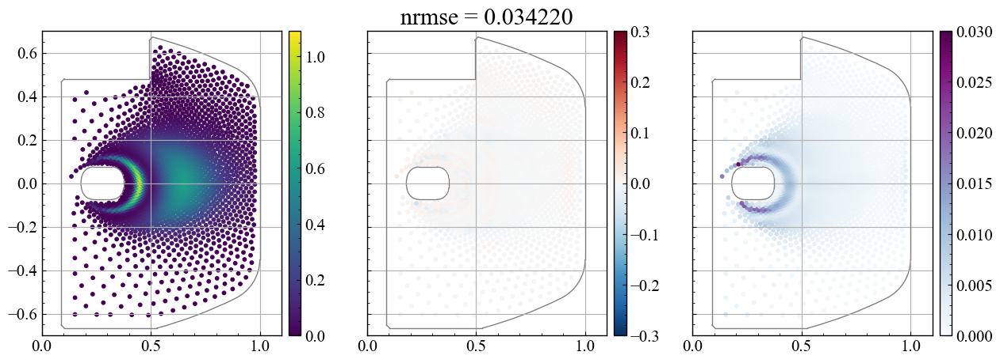


         Current function value: -1289560.625000
         Iterations: 2
         Function evaluations: 53
         Gradient evaluations: 44
calc hessian


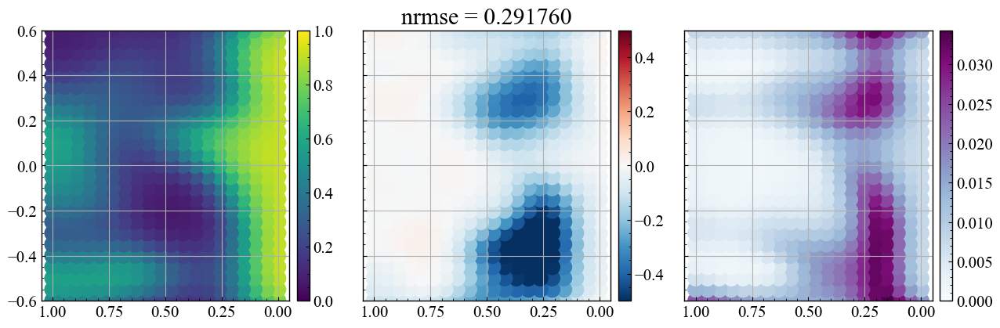

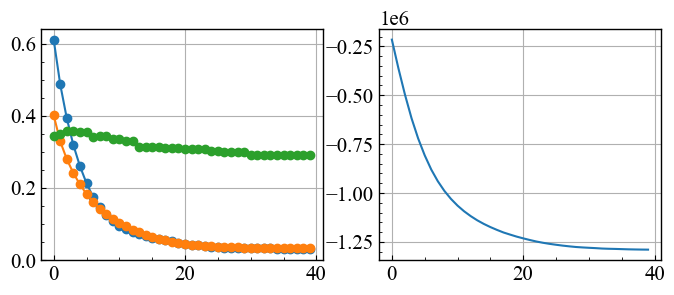

In [243]:
for _ in range(10):
    print('## Iteration is '+str(Iteration)+' ##')
    print('') 
    #ref_now = r_true 
    sig_scale = 0.01

    f_now,Kf_now,f_rmse = Main.calc_f(f_list=f_now,
                               refI_now=ref_now,
                               Kr_now=Kr_now,
                               sig_scale=sig_scale
                               )

    print('') 
    f1_RMSE.append(f_rmse[0])
    f2_RMSE.append(f_rmse[1])
    #print(f1_RMSE)
    #print(f2_RMSE)

    #sig_scale = 0.1

    ref_now,Kr_now,r_rmse,phi = Main.calc_r(refI=ref_now,
                                 f_list=f_now,
                                 Kf_now_list=Kf_now,
                                 sig_scale=sig_scale,
                                 w=5)

    r_RMSE.append(r_rmse)
    Phi_log.append(phi)
    print('') 
    #print(r_RMSE)
    fig,axs =plt.subplots(1,2,figsize=(8,3))
    axs[0].plot(f1_RMSE,'o-')
    axs[0].plot(f2_RMSE,'o-')
    axs[0].plot(r_RMSE,'o-')
    axs[0].set_ylim(0,)
    axs[1].plot(Phi_log)
    plt.show()
    Iteration +=1

(0.0, 0.6399415809200067)

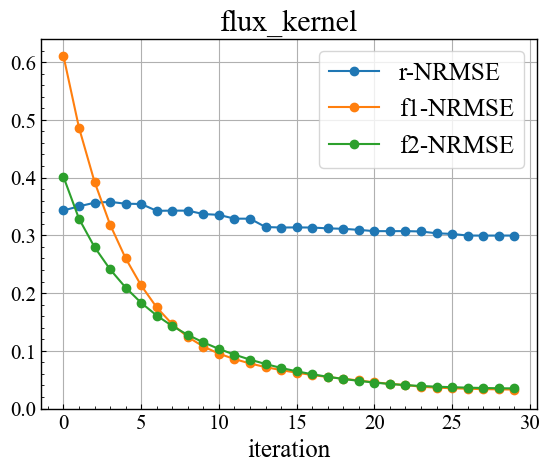

In [242]:
plt.plot(r_RMSE,'o-',label='r-NRMSE')
plt.plot(f1_RMSE,'o-',label='f1-NRMSE')
plt.plot(f2_RMSE,'o-',label='f2-NRMSE')
plt.xlabel('iteration')
plt.legend()
plt.title('flux_kernel')
plt.ylim(0,)

(0.0, 0.4556181675997463)

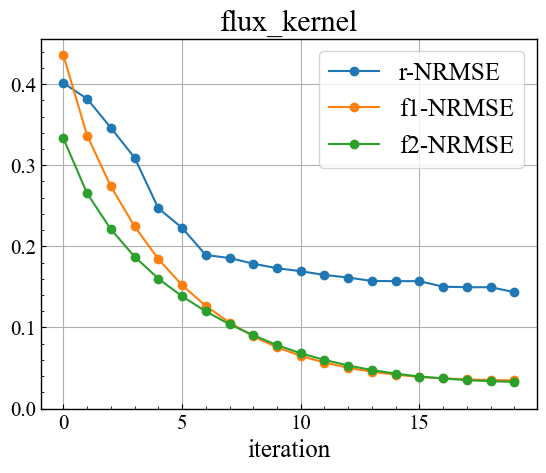

In [221]:
plt.plot(r_RMSE,'o-',label='r-NRMSE')
plt.plot(f1_RMSE,'o-',label='f1-NRMSE')
plt.plot(f2_RMSE,'o-',label='f2-NRMSE')
plt.xlabel('iteration')
plt.legend()
plt.title('flux_kernel')
plt.ylim(0,)

(0.0, 0.4723561261073178)

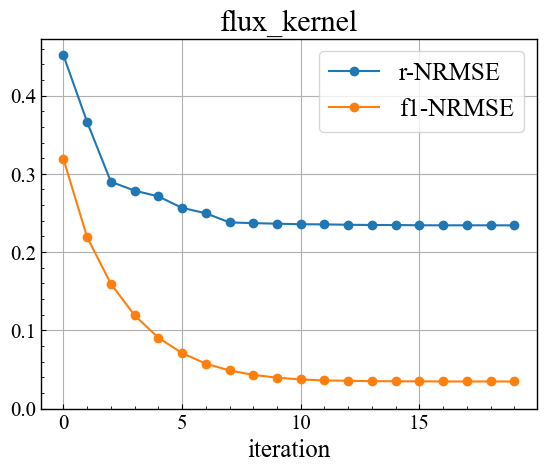

In [80]:
plt.plot(r_RMSE,'o-',label='r-NRMSE')
plt.plot(f1_RMSE,'o-',label='f1-NRMSE')
#plt.plot(f2_RMSE,'o-',label='f2-NRMSE')
plt.xlabel('iteration')
plt.legend()
plt.title('flux_kernel')
plt.ylim(0,)

(0.0, 0.4821203851211006)

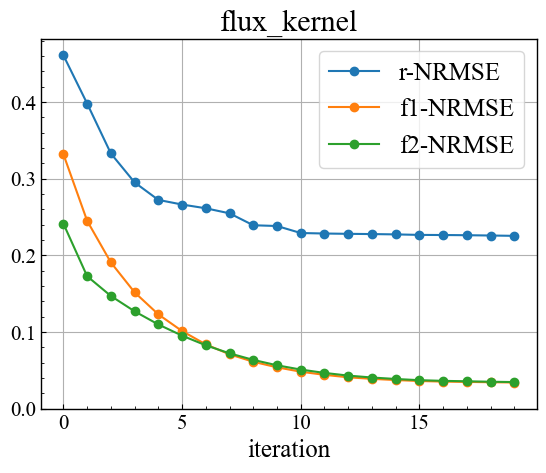

In [72]:
plt.plot(r_RMSE,'o-',label='r-NRMSE')
plt.plot(f1_RMSE,'o-',label='f1-NRMSE')
plt.plot(f2_RMSE,'o-',label='f2-NRMSE')
plt.xlabel('iteration')
plt.legend()
plt.title('flux_kernel')
plt.ylim(0,)

(0.0, 0.5182868582107781)

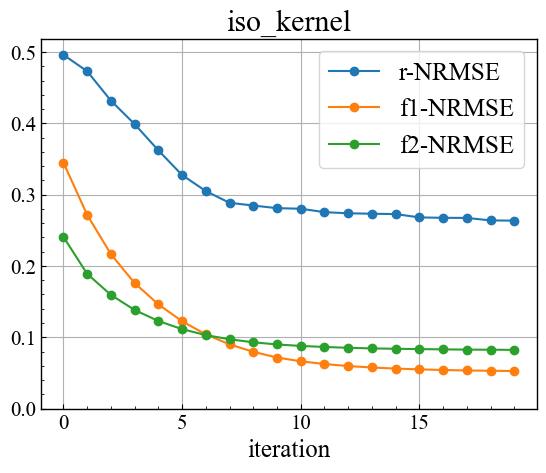

In [66]:
plt.plot(r_RMSE,'o-',label='r-NRMSE')
plt.plot(f1_RMSE,'o-',label='f1-NRMSE')
plt.plot(f2_RMSE,'o-',label='f2-NRMSE')
plt.xlabel('iteration')
plt.legend()
plt.title('iso_kernel')
plt.ylim(0,)